# Prediction Covid_19 Daily Reports
## Table of Contents
<ul>
<li><a href="#intro">Introduction</a></li>
<li><a href="#wrangling">Data Wrangling</a></li>
<li><a href="#eda">Exploratory Data Analysis</a></li>
<li><a href="#conclusion">Conclusion</a></li>


</ul>

pip install 'matplotlib<3.3.0'

In [1]:
!pip install missingno==0.4.2

In [2]:
!pip install lightgbm==3.2.1

     |████████████████████████████████| 2.0 MB 9.2 MB/s 


In [3]:
!pip install cufflinks==0.17.3

     |████████████████████████████████| 81 kB 6.8 MB/s 
     |████████████████████████████████| 121 kB 22.1 MB/s 
     |████████████████████████████████| 243 kB 14.5 MB/s 
     |████████████████████████████████| 2.2 MB 19.0 MB/s 
  Created wheel for cufflinks: filename=cufflinks-0.17.3-py3-none-any.whl size=67918 sha256=90b81d5813c44e468e62aec630d5308f26bc9ccee59c0da42006c04c9a0e79b1
  Stored in directory: /root/.cache/pip/wheels/e1/27/13/3fe67fa7ea7be444b831d117220b3b586b872c9acd4df480d0
Successfully built cufflinks


In [4]:
# Import Libraries

import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import missingno as msno
import math
import random
import glob
import folium as fl
 
from pathlib import Path
from sklearn.impute import SimpleImputer
%matplotlib inline  
pd.options.plotting.backend

from warnings import filterwarnings
filterwarnings('ignore')
plt.style.use('seaborn')
import plotly.offline as py
import plotly.express as px
import cufflinks as cf


In [5]:
# Upload Data
first_csv = pd.read_csv('12-30-2020.csv',sep=",")

third_csv = pd.read_csv('CONVENIENT_global_confirmed_cases.csv',sep=",")


In [6]:
first_csv.head()

,FIPS,Admin2,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key,Incident_Rate,Case_Fatality_Ratio
0,NaN,NaN,NaN,Afghanistan,2020-12-31 05:22:49,33.93911,67.709953,51405,2181,41612,7612.0,Afghanistan,132.050323,4.242778
1,NaN,NaN,NaN,Albania,2020-12-31 05:22:49,41.15330,20.168300,57727,1174,33185,23368.0,Albania,2005.942039,2.033710
2,NaN,NaN,NaN,Algeria,2020-12-31 05:22:49,28.03390,1.659600,99311,2751,66855,29705.0,Algeria,226.473519,2.770086
3,NaN,NaN,NaN,Andorra,2020-12-31 05:22:49,42.50630,1.521800,7983,84,7384,515.0,Andorra,10331.974374,1.052236
4,NaN,NaN,NaN,Angola,2020-12-31 05:22:49,-11.20270,17.873900,17433,405,10859,6169.0,Angola,53.042226,2.323180


In [7]:
first_csv.tail()

,FIPS,Admin2,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key,Incident_Rate,Case_Fatality_Ratio
3975,NaN,NaN,NaN,Zambia,2020-12-31 05:22:49,-13.133897,27.849332,20462,386,18530,1546.0,Zambia,111.303574,1.886424
3976,NaN,NaN,NaN,Zimbabwe,2020-12-31 05:22:49,-19.015438,29.154857,13625,360,11154,2111.0,Zimbabwe,91.671042,2.642202
3977,2066.0,Copper River,Alaska,US,2021-04-02 15:13:53,60.388600,-162.890520,144,0,0,0.0,"Copper River, Alaska, US",NaN,NaN
3978,2063.0,Chugach,Alaska,US,2021-04-02 15:13:53,61.166660,-149.900000,220,3,0,0.0,"Chugach, Alaska, US",NaN,NaN
3979,NaN,NaN,Unknown,China,2020-12-31 05:22:49,NaN,NaN,0,0,0,0.0,"Unknown, China",0.000000,0.000000


<AxesSubplot:>

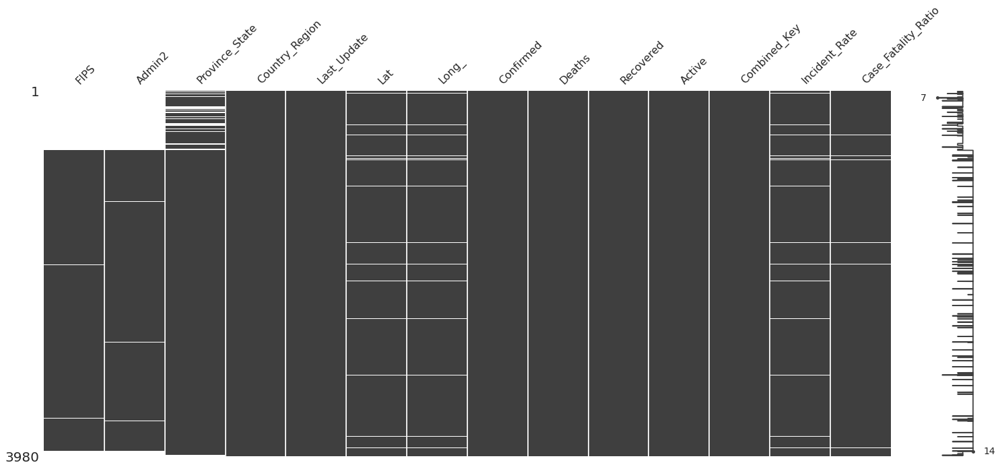

In [11]:
#msno.matrix(first_csv)

In [18]:
first_csv.shape

(3980, 14)

Let's look at list if sum of null values

In [20]:
print(first_csv.isnull().sum())

FIPS                   715
Admin2                 710
Province_State         170
Country_Region           0
Last_Update              0
Lat                     87
Long_                   87
Confirmed                0
Deaths                   0
Recovered                0
Active                   2
Combined_Key             0
Incident_Rate           89
Case_Fatality_Ratio     44
dtype: int64


In [22]:
first_csv.describe()

,FIPS,Lat,Long_,Confirmed,Deaths,Recovered,Active,Incident_Rate,Case_Fatality_Ratio
count,3265.000000,3893.000000,3893.000000,3.980000e+03,3980.000000,3.980000e+03,3.978000e+03,3891.000000,3936.000000
mean,32386.688208,36.005760,-72.065449,2.081271e+04,455.236683,1.174811e+04,8.591304e+03,5680.355004,1.963057
std,18017.294540,12.995066,53.528288,1.041310e+05,2627.865301,8.145510e+04,6.031492e+04,3171.896684,6.692590
min,66.000000,-52.368000,-174.159600,0.000000e+00,0.000000,0.000000e+00,-1.066771e+06,0.000000,0.000000
25%,19049.000000,33.272157,-96.616339,6.887500e+02,9.000000,0.000000e+00,5.752500e+02,3515.354231,0.965930
50%,30067.000000,37.954743,-86.854759,1.928000e+03,31.000000,0.000000e+00,1.640000e+03,5724.734510,1.533272
75%,47039.000000,42.227692,-77.494647,7.623500e+03,113.000000,0.000000e+00,4.872000e+03,7628.592069,2.311228
max,99999.000000,71.706900,178.065000,2.597124e+06,64016.000000,2.078629e+06,2.363858e+06,27058.241214,362.962963


In [24]:
#drop the columns
first_csv.drop(columns=['FIPS','Admin2','Province_State'], inplace=True)
first_csv.head()

,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key,Incident_Rate,Case_Fatality_Ratio
0,Afghanistan,2020-12-31 05:22:49,33.93911,67.709953,51405,2181,41612,7612.0,Afghanistan,132.050323,4.242778
1,Albania,2020-12-31 05:22:49,41.15330,20.168300,57727,1174,33185,23368.0,Albania,2005.942039,2.033710
2,Algeria,2020-12-31 05:22:49,28.03390,1.659600,99311,2751,66855,29705.0,Algeria,226.473519,2.770086
3,Andorra,2020-12-31 05:22:49,42.50630,1.521800,7983,84,7384,515.0,Andorra,10331.974374,1.052236
4,Angola,2020-12-31 05:22:49,-11.20270,17.873900,17433,405,10859,6169.0,Angola,53.042226,2.323180


## Exploratory Data Analysis

In [27]:
#Let's take a look at our columns
columns_first = first_csv.columns
columns_first

Index(['Country_Region', 'Last_Update', 'Lat', 'Long_', 'Confirmed', 'Deaths',
       'Recovered', 'Active', 'Combined_Key', 'Incident_Rate',
       'Case_Fatality_Ratio'],
      dtype='object')

In [28]:


#Let's aggregate the dataset by country
first_csv_aggregated = first_csv.groupby("Country_Region").sum()
first_csv_aggregated.head()



,Lat,Long_,Confirmed,Deaths,Recovered,Active,Incident_Rate,Case_Fatality_Ratio
Country_Region,,,,,,,,
Afghanistan,33.93911,67.709953,51405,2181,41612,7612.0,132.050323,4.242778
Albania,41.15330,20.168300,57727,1174,33185,23368.0,2005.942039,2.033710
Algeria,28.03390,1.659600,99311,2751,66855,29705.0,226.473519,2.770086
Andorra,42.50630,1.521800,7983,84,7384,515.0,10331.974374,1.052236
Angola,-11.20270,17.873900,17433,405,10859,6169.0,53.042226,2.323180


alt.Chart(...)

In [31]:
most_affected=first_csv_aggregated.sort_values(by = columns_first[-1],ascending = False)
most_affected=most_affected.head(10)

In [34]:
#find maxmimum infection rate for US
first_csv_aggregated.loc["Turkey"].diff().max()

2194236.7567

In [35]:
#find maximum infection rate for all of the countries.
countries = list(first_csv_aggregated.index)
max_infection_rates = []
for c in countries :
    max_infection_rates.append(first_csv_aggregated.loc[c].diff().max())
max_infection_rates

[51337.290047,
 57706.8317,
 99309.3404,
 9816.97437390798,
 17415.1261,
 219.7964,
 1613991.6167,
 158832.9618,
 27274.1561,
 357887.4499,
 217588.4231,
 7935.035889,
 92374.45,
 512405.6437,
 431.5432,
 192333.0466,
 644191.8864,
 10812.4976,
 3248.6842,
 564.5664,
 158435.5887,
 110967.3209,
 14675.3151,
 7620508.9733,
 146.0,
 201194.5142,
 6632.5616,
 123644.044,
 779.0811,
 11816.0418,
 361.0,
 26265.4979,
 578468.5979,
 4942.0606,
 2058.2678,
 608091.1931,
 92189.5789,
 1628909.2963,
 721.6667,
 6892.1723,
 17354.2413,
 168197.7534,
 22371.5471,
 208430.8,
 11764.781167,
 21985.5701,
 701606.527,
 161902.0143,
 712.0,
 5781.4097,
 149.371,
 169649.1627,
 211590.1834,
 136613.197502,
 46048.8965,
 5253.7321,
 1212.2177,
 27230.9864,
 9114.5341,
 123815.5103,
 195.7784,
 35832.251849,
 2657862.646914,
 9559.3906,
 3812.3101,
 225849.6431,
 1740988.5539,
 54772.0232,
 137896.1757,
 188.679,
 137256.2308,
 13716.6966,
 2467.1804,
 6377.93018,
 10071.2852,
 3325.453646477132,
 120998

In [36]:
#Let's add our findings to our data
first_csv_aggregated["max_infection_rates"] = max_infection_rates

In [37]:
#Let's see if it's added
first_csv_aggregated.head()

,Lat,Long_,Confirmed,Deaths,Recovered,Active,Incident_Rate,Case_Fatality_Ratio,max_infection_rates
Country_Region,,,,,,,,,
Afghanistan,33.93911,67.709953,51405,2181,41612,7612.0,132.050323,4.242778,51337.290047
Albania,41.15330,20.168300,57727,1174,33185,23368.0,2005.942039,2.033710,57706.831700
Algeria,28.03390,1.659600,99311,2751,66855,29705.0,226.473519,2.770086,99309.340400
Andorra,42.50630,1.521800,7983,84,7384,515.0,10331.974374,1.052236,9816.974374
Angola,-11.20270,17.873900,17433,405,10859,6169.0,53.042226,2.323180,17415.126100


In [38]:
#Extracting just the useful column.
covid_data = pd.DataFrame(first_csv_aggregated["max_infection_rates"])

In [39]:
#Let's sort our findings
covid_data.sort_values(by ='max_infection_rates', inplace=True, ascending = False)

In [40]:
#Let's see the most affected 15 countries
top_15=covid_data.head(15)

Text(0.5, 1.0, 'Countries with biggest infection rates')

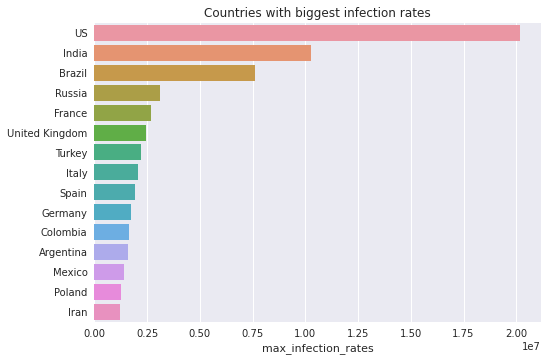

In [41]:
ax = sns.barplot(x=top_15['max_infection_rates'], y=top_15.index.values)
ax.set_title("Countries with biggest infection rates")

In [42]:
# Which countries showed a higher recovery rate in covid cases?

Total_cases_recovered = first_csv.groupby('Country_Region')['Recovered'].sum()
Total_cases_recovered = Total_cases_recovered.sort_values(ascending=False)

Top_Recovered = Total_cases_recovered[1:11].index
print(Top_Recovered)

Index(['Brazil', 'Russia', 'Turkey', 'Colombia', 'Italy', 'Argentina',
       'Germany', 'Mexico', 'Poland', 'Iran'],
      dtype='object', name='Country_Region')


In [43]:
cases = Total_cases_recovered[1:11].values # Number of Cases in Top 10 Countries 

total_recovered = first_csv.groupby('Country_Region')['Recovered'].sum()
Deaths = Total_cases_recovered[Top_Recovered].values # Number recoveries in Top 10 Countries

cases_recovered_df = pd.DataFrame({'Country_Region': Top_Recovered, 'Total Recovered': cases})
print(cases_recovered_df)

  Country_Region  Total Recovered
0         Brazil          6814092
1         Russia          2499465
2         Turkey          2078629
3       Colombia          1497180
4          Italy          1445690
5      Argentina          1426676
6        Germany          1345952
7         Mexico          1066771
8         Poland          1025889
9           Iran           978714


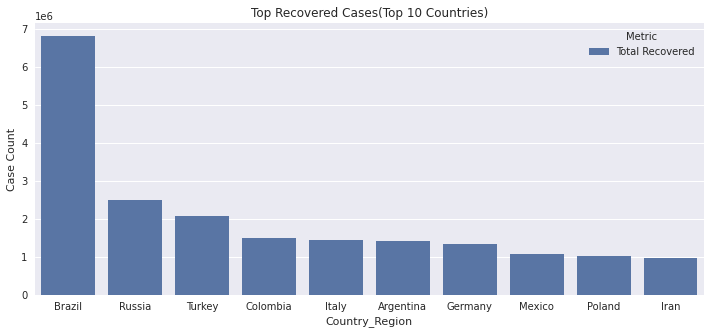

In [44]:
plot_data = pd.melt(cases_recovered_df, id_vars = ['Country_Region'],  value_vars=['Total Recovered'], 
                var_name='Metric', value_name='Case Count') 
plt.figure(figsize=(12, 5))
sns.barplot(x="Country_Region", hue="Metric", y="Case Count", data=plot_data)
plt.title('Top Recovered Cases(Top 10 Countries)')
plt.show()

In [45]:
import plotly.express as px

'''fig = px.bar(first_csv, x='Country_Region', y='Recovered')
fig.show()'''

fig = px.bar(first_csv, x='Country_Region', y='Recovered',
             hover_data=['Deaths', 'Confirmed'], color='Deaths',
             labels={'pop':'Higher recovery rate'}, height=400)
fig.show()

In [46]:
# What region has the highest:  * death rate , * confirmed cases

first_csv_aggregated.sort_values(by ='Deaths', inplace=True, ascending = False)


In [47]:
#global confirmed cases
from datetime import datetime as dt

third_csv = third_csv[1:]
third_csv = third_csv.rename(columns={"Country/Region": "Date"})

def convert_date(date_str):
    return dt.strptime(date_str, '%m/%d/%y')

third_csv["Date"] = third_csv["Date"].map(convert_date)

country_cols = [col for col in third_csv.columns if col not in ["Date"]]

third_csv.head()


,Date,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,...,United Kingdom.11,Uruguay,Uzbekistan,Vanuatu,Venezuela,Vietnam,West Bank and Gaza,Yemen,Zambia,Zimbabwe
1,2020-01-23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0
2,2020-01-24,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2020-01-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2020-01-26,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,2020-01-27,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [48]:

third_csv = pd.melt(third_csv, id_vars=['Date'], value_vars=country_cols,
                                    var_name='Country', value_name='Count')

In [49]:
third_csv.head()

,Date,Country,Count
0,2020-01-23,Afghanistan,0.0
1,2020-01-24,Afghanistan,0.0
2,2020-01-25,Afghanistan,0.0
3,2020-01-26,Afghanistan,0.0
4,2020-01-27,Afghanistan,0.0


In [50]:
import plotly.express as px
import seaborn as sns


fig = px.line(third_csv, x="Date", y="Count", color="Country", 
              title='Transition in the number of confirmed cases of each countries',
              template="simple_white")
fig.update_layout(showlegend=False)
fig.show()

In [51]:
#selected countries
selected_countries  = ["US", "India", "Spain", "Iran", "United Kingdom", "Turkey"]
df_global_confirmed_cases_selected = third_csv[third_csv["Country"].isin(selected_countries)].reset_index(drop=True)

In [52]:
fig = px.line(df_global_confirmed_cases_selected, x="Date", y="Count", color="Country", 
              title='Transition in the number of confirmed cases of each countries',
              template="simple_white")
fig.update_layout(showlegend=False)
fig.show()


### COVID19 accross the USA

In [53]:

cases = pd.read_csv("CONVENIENT_us_confirmed_cases.csv"
                    ,index_col= False
                    ,header = None
                   ).transpose()

#adding column names to the cases data 
cases.columns = cases.iloc[0]
cases = cases.iloc[1:,0:]

cases.head()

,Province_State,Admin2,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,...,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21,5/30/21,5/31/21,6/1/21,6/2/21,6/3/21
1,Alabama,Autauga,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,8.0,9.0,6.0,1.0,0.0,0.0,0.0,8.0,11.0,11.0
2,Alabama,Baldwin,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,24.0,15.0,13.0,14.0,0.0,0.0,0.0,41.0,13.0,10.0
3,Alabama,Barbour,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.0,0.0,2.0,1.0,0.0,0.0,0.0,3.0,3.0,3.0
4,Alabama,Bibb,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,2.0,4.0,-2.0,0.0,0.0,0.0,1.0,0.0,0.0
5,Alabama,Blount,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,15.0,9.0,6.0,2.0,0.0,0.0,0.0,23.0,2.0,5.0


In [54]:
#deaths 
deaths = pd.read_csv("CONVENIENT_us_deaths.csv"
                    ,index_col= False
                    ,header = None
                   ).transpose()

#chaning column names to the first row values 
deaths.columns = deaths.iloc[0]
deaths = deaths.iloc[1:,0:]
deaths.head()

,Province_State,Admin2,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,...,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21,5/30/21,5/31/21,6/1/21,6/2/21,6/3/21
1,Alabama,Autauga,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,Alabama,Baldwin,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
3,Alabama,Barbour,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Alabama,Bibb,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,Alabama,Blount,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [55]:
cases_md = pd.read_csv("CONVENIENT_us_metadata.csv")

#fips data to get the FIPS id 
fips = pd.read_csv("RAW_us_confirmed_cases.csv").iloc[:,0:7]

#filling null with 0s 
fips.FIPS = fips.FIPS.fillna(0) #replacing NA values with 0
fips.head()

,Province_State,Admin2,UID,iso2,iso3,code3,FIPS
0,Alabama,Autauga,84001001,US,USA,840,1001.0
1,Alabama,Baldwin,84001003,US,USA,840,1003.0
2,Alabama,Barbour,84001005,US,USA,840,1005.0
3,Alabama,Bibb,84001007,US,USA,840,1007.0
4,Alabama,Blount,84001009,US,USA,840,1009.0


In [56]:
# appending metadata to original data 
merged_data = pd.merge(cases_md, cases, on = ('Province_State','Admin2'), how = 'left')

#appending FIPS data to the metadata + original data - FIPS id needs to be used in the mapping 
merged_data = pd.merge(fips,merged_data, on = ('Province_State','Admin2'),how = 'left')

merged_data.head()

,Province_State,Admin2,UID,iso2,iso3,code3,FIPS,Population,Lat,Long,...,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21,5/30/21,5/31/21,6/1/21,6/2/21,6/3/21
0,Alabama,Autauga,84001001,US,USA,840,1001.0,55869,32.539527,-86.644082,...,8.0,9.0,6.0,1.0,0.0,0.0,0.0,8.0,11.0,11.0
1,Alabama,Baldwin,84001003,US,USA,840,1003.0,223234,30.727750,-87.722071,...,24.0,15.0,13.0,14.0,0.0,0.0,0.0,41.0,13.0,10.0
2,Alabama,Barbour,84001005,US,USA,840,1005.0,24686,31.868263,-85.387129,...,3.0,0.0,2.0,1.0,0.0,0.0,0.0,3.0,3.0,3.0
3,Alabama,Bibb,84001007,US,USA,840,1007.0,22394,32.996421,-87.125115,...,1.0,2.0,4.0,-2.0,0.0,0.0,0.0,1.0,0.0,0.0
4,Alabama,Blount,84001009,US,USA,840,1009.0,57826,33.982109,-86.567906,...,15.0,9.0,6.0,2.0,0.0,0.0,0.0,23.0,2.0,5.0


In [57]:
fd = pd.concat(
                 [ merged_data[['Province_State','Admin2','Population','FIPS','Lat','Long']]
                  ,merged_data.iloc[:,10:].astype(float).sum(axis = 1)] #this code gives the sum     
                  ,axis = 1)

#chaning the column name from 0 to Total cases 
fd =  fd.rename(columns = {0:'Total_cases'})

# changing FIPS column from float to string and appending leading zeros to be in compliance with the FIPS format 
fd.FIPS = fd.FIPS.astype(int).astype(str).str.zfill(5) 


fd.head()

,Province_State,Admin2,Population,FIPS,Lat,Long,Total_cases
0,Alabama,Autauga,55869,01001,32.539527,-86.644082,7172.0
1,Alabama,Baldwin,223234,01003,30.727750,-87.722071,21684.0
2,Alabama,Barbour,24686,01005,31.868263,-85.387129,2343.0
3,Alabama,Bibb,22394,01007,32.996421,-87.125115,2665.0
4,Alabama,Blount,57826,01009,33.982109,-86.567906,6894.0


In [58]:
from urllib.request import urlopen
import json

with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)


fig = px.choropleth_mapbox(fd,geojson=counties , locations = 'FIPS', color='Total_cases',
                           color_continuous_scale= "earth", #"Viridis",
                           range_color=(0,4000),
                           mapbox_style= "carto-darkmatter", #"carto-positron","open-street-map",
                           zoom=3, center = {"lat": 37.0902, "lon": -95.7129},
                           opacity=0.5,
                           hover_data=["Province_State", "Admin2"],
                           template = 'plotly_dark',
                           #title = 'COVID - 19 Cases Across USA - County View',
                           labels={'Total_cases': 'COVID Cases'}
                          )

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})


fig.show()

## Global cases

In [59]:

raw_conf = pd.read_csv('RAW_global_confirmed_cases.csv')
raw_deaths = pd.read_csv('RAW_global_deaths.csv')

In [61]:
confirmed = raw_conf.groupby('Country/Region')[list(raw_conf.columns)[4:]].agg('sum')

In [62]:
death = raw_deaths.groupby('Country/Region')[list(raw_conf.columns)[4:]].agg('sum')

In [63]:
case_conf = confirmed.T

In [66]:
case_conf[['US', 'India', 'Brazil', 'Turkey','France']].iplot(title='5 countries having huge covid 19 confirmed case in the world.',
                                                             legend=True)

KeyboardInterrupt: 

In [67]:
fatalities = death.T

In [68]:
fatalities[['US', 'India', 'Brazil', 'Turkey','Italy']].iplot(title='5 countries having huge covid 19 deaths in the world.',
                                                            legend=True)

KeyboardInterrupt: 

# STREAMLIT PART


## Geospatial analysis

In [69]:
region = []
cases = []
time = []
latitude = []
longitude = []
fat = []
for u in list(raw_conf.columns)[4:]:
    time.append([u for i in range(raw_conf.shape[0])])
    region.append(list(raw_conf['Country/Region']))
    cases.append(list(raw_conf[u]))
    
    latitude.append(list(raw_conf.Lat))
    longitude.append(list(raw_conf.Long))
    fat.append(list(raw_deaths[u]))

In [70]:
global_covid19 = pd.DataFrame()


In [71]:


global_covid19['date'] = np.concatenate(time)
global_covid19['country'] = np.concatenate(region)
global_covid19['Lat'] = np.concatenate(latitude)
global_covid19['Long'] = np.concatenate(longitude)
global_covid19['cases'] = np.concatenate(cases)
global_covid19['fatalities'] = np.concatenate(fat)



In [72]:


center_point = dict(lon=0, lat=0)
figx = px.density_mapbox(global_covid19, lat='Lat', lon='Long', z="cases",
                        center = center_point, hover_name='country', zoom = 5,
                         range_color= [20, 20] , radius=20,
                        mapbox_style= 'open-street-map', title='Novel Covid19 cases in the world',
                        animation_frame='date')
figx.update(layout_coloraxis_showscale=True)
figx.show()



In [74]:
# Compare the rate of increase in recovered cases per country
total_recovered = first_csv_aggregated.groupby('Country_Region')['Recovered'].sum().values
total_confirmed = first_csv_aggregated.groupby('Country_Region')['Confirmed']
Confirmed_to_Recovered= (total_recovered/total_confirmed).sort_values(ascending = False)[:10]

ValueError: operands could not be broadcast together with shapes (191,) (191,2) 

In [75]:
plt.figure(figsize=(10, 5))
sns.set_color_codes("pastel")
sns.barplot(y = 'Country_Region', x = Recovered.values, orient = "h", color="b")
plt.title('Comparison on Recovered Cases (Top 10 Countries)')
plt.xlabel('Total Recovered / Total Confirmed')
plt.ylabel('Country')
plt.show()

NameError: name 'Recovered' is not defined

<Figure size 720x360 with 0 Axes>

In [ ]:
*# Is there/what is the correlation between fatality rate and recovered?
corr = first_csv.corr(method='pearson')
corr.head()



,FIPS,Lat,Long_,Confirmed,Deaths,Recovered,Active,Incident_Rate,Case_Fatality_Ratio
FIPS,1.000000,-0.150520,0.198603,-0.071927,-0.054425,NaN,-0.073451,-0.150198,0.044667
Lat,-0.150520,1.000000,-0.155009,-0.138081,-0.151565,-0.184118,0.008055,0.241964,-0.110397
Long_,0.198603,-0.155009,1.000000,0.226749,0.171816,0.252604,0.060799,-0.502745,-0.030518
Confirmed,-0.071927,-0.138081,0.226749,1.000000,0.900880,0.803967,0.601490,-0.122679,0.006581
Deaths,-0.054425,-0.151565,0.171816,0.900880,1.000000,0.665930,0.612528,-0.122693,0.084193


In [ ]:
#Streamlit part
DATA_URL = ('covid.csv')
def load_data():
    data = pd.read_csv(DATA_URL)
    data['date'] = pd.to_datetime(data['date']).dt.strftime('%Y-%m-%d')
    return data
df = load_data()

KeyError: 'Date'

In [ ]:
subset_data = df
country_name_input = st.sidebar.multiselect(
'Country name',
df.groupby('Country').count().reset_index()['Country'].tolist())
# by country name
if len(country_name_input) > 0:
    subset_data = df[df['Country'].isin(country_name_input)]

NameError: name 'df' is not defined

In [ ]:
#Selectbox
metrics =['total_cases','new_cases','total_deaths','new_deaths','total_cases_per_million','new_cases_per_million','total_deaths_per_million','new_deaths_per_million','total_tests','new_tests','total_tests_per_thousand','new_tests_per_thousand']
cols = st.selectbox('Covid metric to view', metrics)
# let's ask the user which column should be used as Index
if cols in metrics:   
    metric_to_show_in_covid_Layer = cols

NameError: name 'st' is not defined

In [ ]:
#BAR CHARTS
filter_data = df[df['Date'] >='2020-04-01'].set_index("Date") 
st.markdown(str(','.join(country_name_input)) + " daily Death cases from 1st April 2020")
# bar chart 
st.bar_chart(filter_data[['Deaths']])

NameError: name 'df' is not defined

In [ ]:
## linechart (ALTAIR CHARTS)
df = load_data()
st.write(df)
filter_data = df[df['date'] >='2020-04-01'].set_index("date") 
subset_data = df

st.subheader('Comparision of infection growth')subheader('Comparision of infection growth')
total_cases_graph  =alt.Chart(subset_data).transform_filter(
   alt.datum.total_cases > 0  
).mark_line().encode(
    x=alt.X('date', type='nominal', title='Date'),
    y=alt.Y('sum(total_cases):Q',  title='Confirmed cases'),
    color='Country',
    tooltip = 'sum(total_cases)',
).properties(
    width=1500,
    height=600
).configure_axis(
    labelFontSize=17,
    titleFontSize=20
)

st.altair_chart(total_cases_graph)

IndentationError: unexpected indent (<ipython-input-17-9babb80a044a>, line 11)

In [ ]:
## ANIMATED MAP

# Variable for date picker, default to Jan 1st 2020
date = datetime.date(2020,1,1)
# Set viewport for the deckgl map
view = pdk.ViewState(latitude=0, longitude=0, zoom=0.2,)
# Create the scatter plot layer
covidLayer = pdk.Layer(
        "ScatterplotLayer",
        data=df,
        pickable=False,
        opacity=0.3,
        stroked=True,
        filled=True,
        radius_scale=10,
        radius_min_pixels=5,
        radius_max_pixels=60,
        line_width_min_pixels=1,
        get_position=["Longitude", "Latitude"],
        get_radius=metric_to_show_in_covid_Layer,
        get_fill_color=[252, 136, 3],
        get_line_color=[255,0,0],
        tooltip="test test",
    )

# Create the deck.gl map
r = pdk.Deck(
    layers=[covidLayer],
    initial_view_state=view,
    map_style="mapbox://styles/mapbox/light-v10",
)
# Create a subheading to display current date
subheading = st.subheader("")
# Render the deck.gl map in the Streamlit app as a Pydeck chart 
map = st.pydeck_chart(r)
# Update the maps and the subheading each day for 90 days
for i in range(0, 120, 1):
    # Increment day by 1
    date += datetime.timedelta(days=1)
    # Update data in map layers
    covidLayer.data = df[df['date'] == date.isoformat()]
    # Update the deck.gl map
    r.update()
    # Render the map
    map.pydeck_chart(r)
    # Update the heading with current date
    subheading.subheader("%s on : %s" % (metric_to_show_in_covid_Layer, date.strftime("%B %d, %Y")))
    
# wait 0.1 second before go onto next day
    time.sleep(0.05)

NameError: name 'df' is not defined

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=cc76a8cc-d334-4029-81c1-fc0a05653779' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>